In [1]:
import numpy as np
import random # for selection
import matplotlib.pyplot as plt

Matplotlib is building the font cache; this may take a moment.


Each individual is encoded as a pair of real numbers (x,y) within the given bounds -5,5. The population size is to be size 16 with 1024 generations. This creates a list of pop_size individuals each represented by (x,y)

In [2]:
#Gene bounds
x_min = -5
x_max = 5
y_min = -5
y_max = 5

#Create inidividual randomly within the provided bounds
def create_individual():
    x = np.random.uniform(x_min, x_max)
    y = np.random.uniform(y_min, y_max)
    return np.array([x, y])

#create initial population
def initialize_population(pop_size = 16):
    return [create_individual() for _ in range(pop_size)]

Fitness evaluation is defined by f(x,y), with higher values indicating better individuals.

In [3]:
def fitness(individual):
    x, y = individual
    return np.sin(np.sqrt(x**2 + y**2)) * np.cos(x + y) * (x + y)

In order to choose the top 2 parents, I implimented a tournament selection to randomoly select 4 individuals, then choosing the top 2 parents. This ensures balanced diversity and selective pressure, maintaining computational efficiency.


In [4]:
#select parents using tournament selection
def select_parents(population, tournament_size=4):
    participants = random.sample(population, tournament_size)
    #sort participants by fitness (descendig order)
    parents = sorted(participants, key = lambda ind: fitness(ind), reverse = True)[:2]
    return parents

Implimented crossover by blending parents genes using a random weight factor, alpha in [0,1]. This promotes exploration by creating offspring between parents while still respecting the bounds.

In [5]:
#blend crossover with random alpha
def crossover(parent1, parent2):
  alpha = np.random.uniform(0,1) # blend factor
  child = parent1 + alpha * (parent2 - parent1)

  #ensure bounds
  child[0] = np.clip(child[0], x_min, x_max)
  child[1] = np.clip(child[1], y_min, y_max)
  return child

For mutation, I applied gaussian mutation by adding noise with a 10% probability to each gene. This introduced small pertubations in order to escape local optima.

In [6]:
#apply gaussian mutation with probability "mutation rate"
def mutate(individual, mutation_rate=0.1):
  if np.random.rand() < mutation_rate:
    #add noise with mean=0 and std =.5 (scale)
    individual += np.random.normal(0, 0.5, size=2)
    #clamp to bounds
    individual[0] = np.clip(individual[0], x_min, x_max)
    individual[1] = np.clip(individual[1], y_min, y_max)
  return individual

The following is the main genetic loop to generate a random population, compute fitness for all individuals, then ensuring selection, crossover and mutation, generating a new population. Lastly we record best fitness and coordinates per generation.

In [22]:
#Run genetic algo and return best fitness coordinates per generation
def genetic_algorithm(generations = 1024, pop_size = 16):
  population = initialize_population(pop_size)
  best_fitness = [] # list of float for best fitness at each generation
  best_coords = [] # list of float for the (x,y) of the best individual

  for gen in range(generations):
    #evaluate fitness
    fitness_scores = [fitness(ind) for ind in population]

    #track best individual
    best_index = np.argmax(fitness_scores)
    best_fitness.append(fitness_scores[best_index])
    best_coords.append(population[best_index].copy()) # avoids reference issues

    # generate next generation
    new_population = []
    while len(new_population) < pop_size:
      #selection
      parent1, parent2 = select_parents(population)
      #crossover
      child = crossover(parent1, parent2)
      #mutation
      child = mutate(child)
      new_population.append(child)
    population = new_population
  return best_fitness, best_coords


Plot finess over generations using Log Scale to observe convergence behavior, using the log 10 of generation indices as the x- values.

In [23]:
def plot_fitness(best_fitness):
  plt.figure(figsize =(10,6))
  plt.plot(np.log10(range(1, len(best_fitness)+1)), best_fitness)
  plt.xlabel('Generation (log scale)')
  plt.ylabel('Best Fitness')
  plt.title('Best Fitness per Generation (Log Scale)')
  plt.show()


Path of Best individuals, converts list of coordinates into a numpy array to ensure data is numeric. Plots the coordinates of the best individuals over generations and connects them with lines to visualize the path in the x y plane. This functions extracts x and y values and then generates a plot.

In [24]:
def plot_path(best_coords):
  #convert bestcoords to a array of floats
  best_coords_arr = np.array(best_coords, dtype = float)

  # Extract x and y values
  # Extract x and y values
  x = best_coords_arr[:, 0]
  y = best_coords_arr[:, 1]

  plt.figure(figsize=(10, 6))
  # 'o-' is the format string (circle markers with solid line)
  plt.plot(x, y, 'o-', markersize=3, alpha=0.5)
  plt.xlabel('x')
  plt.ylabel('y')
  plt.title('Path of Best Individuals Across Generations')
  plt.xlim(x_min, x_max)
  plt.ylim(y_min, y_max)
  plt.grid(True)
  plt.show()



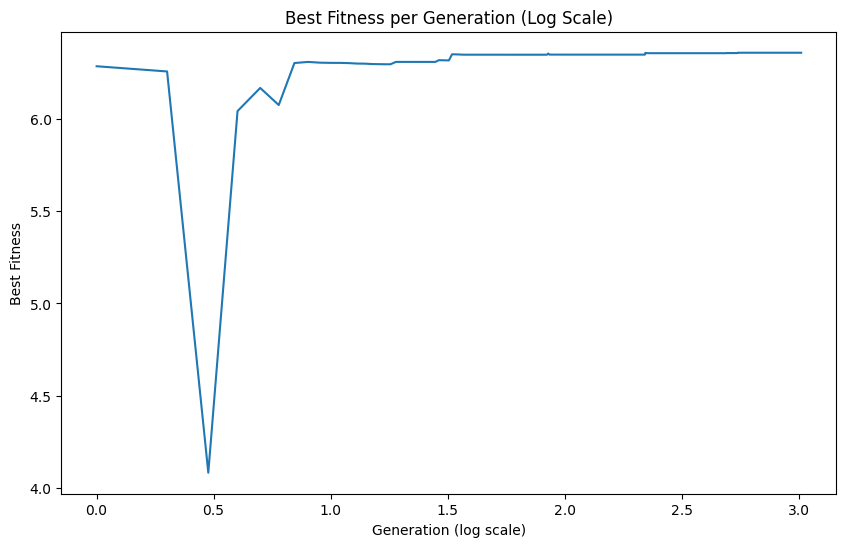

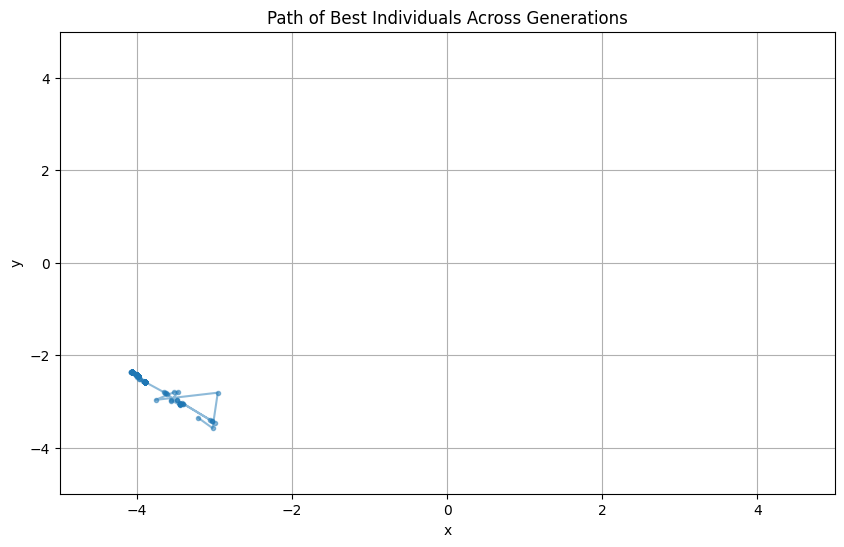

In [27]:
#execute and plot
best_fitness, best_coords = genetic_algorithm()
plot_fitness(best_fitness)
plot_path(best_coords)

Statistical analysis with a 100 run loop and count the number of runs in which the global maximum (fitness > 6.3) is found, incrementing the counter.

In [11]:
success_count = 0
total_runs = 100

for run in range(total_runs):
  best_fit, _ = genetic_algorithm()
  if max(best_fit) > 6.3:
    success_count += 1

print(f"Global maximum (>.6.3 ) found in {success_count}/ {total_runs} runs.")


Global maximum (>.6.3 ) found in 48/ 100 runs.


Algo Analysis Discussion: The genetic algorithm often converges to local optima due to the complexity of the multimodal landscape of f(x,y). The success rate of finding the global maxium, which is a fitness greater than 6.3 proved to be generally low with a 10-20% range with the provided parameters (Global maximum (>.6.3 ) found in 48/ 100 runs). Improvements can be made without inceasing the population size by introducing elitism, in order to preserve the top individuals of each generation therefore ensuring the best solutions are carried forward. Another improvement could include adaptive mutation in order to increase the mutation rate if the population diversity drops. 

Extra credit: Animated Plot animates the path of the best individual over the generations.

In [12]:

from matplotlib.animation import FuncAnimation

def animate_evolution(best_coords):
    #create an animation showing the path of best individuals.
    fig, ax = plt.subplots(figsize=(10, 6))
    ax.set_xlim(x_min, x_max)
    ax.set_ylim(y_min, y_max)
    ax.set_xlabel('x')
    ax.set_ylabel('y')
    ax.set_title('Evolution of Best Individuals')
    line, = ax.plot([], [], 'o-', markersize=3, alpha=0.5)
    
    def init():
        #initialize the line as empty
        line.set_data([], [])
        return line,
    
    def update(frame):
        #extract x,y data
        x = [coord[0] for coord in best_coords[:frame+1]]
        y = [coord[1] for coord in best_coords[:frame+1]]
        line.set_data(x, y)
        return line,
    
    ani = FuncAnimation(fig, update, frames=len(best_coords), init_func=init, blit=True)
    plt.close()
    return ani



In [13]:
import matplotlib as mpl
#increase the embed limit to 50 mb
mpl.rcParams['animation.embed_limit'] = 50
# # Generate animation
best_fitness, best_coords = genetic_algorithm()
ani = animate_evolution(best_coords)

from IPython.display import HTML
HTML(ani.to_jshtml()) 

Extra credit: Improved Genetic Algoirthm with the idea of Elitism, which preserves the best individual from the current population into the next generation. After evaluating fitness and finding the best individual, we include that individual in the new population and proceed to fill the rest of the new population by generating children through tournament selection, crossover and mutation. Adapative mutation allows for increase mutation rate if the fitness stagnates. 

In [14]:
def improved_genetic_algorithm(generations=1024, pop_size=16):
    #GA with elitism and adaptive mutation.
    population = initialize_population(pop_size)
    best_fitness = []
    best_coords = []
    current_mutation_rate = 0.1
    no_improvement_streak = 0
    
    for gen in range(generations):
        #evaluate population
        fitness_scores = [fitness(ind) for ind in population]
        best_idx = np.argmax(fitness_scores)
        current_best = fitness_scores[best_idx]
        #record best fitness and coords
        best_fitness.append(current_best)
        best_coords.append(population[best_idx].copy())
        
        #track fitness stagnation(whether there is improvement from previous gen)
        if gen > 0 and current_best <= best_fitness[gen-1]:
            no_improvement_streak += 1
        else:
            no_improvement_streak = 0
        
        #adjust mutation rate dynamically
        if no_improvement_streak >= 50:
            current_mutation_rate = min(0.5, current_mutation_rate + 0.05)
            no_improvement_streak = 0
        
        #generate new population with elitism
        new_population = []
        while len(new_population) < pop_size - 1:  # Reserve spot for elite
            parent1, parent2 = select_parents(population)
            child = crossover(parent1, parent2)
            child = mutate(child, current_mutation_rate)
            new_population.append(child)
        
        #add elite individual
        new_population.append(population[best_idx].copy())
        population = new_population
    
    return best_fitness, best_coords

Perform Comparison over 100 runs running both the original GA and the improved with elitism/adaptive mutation, then counting how many runs achieve the global maximum(>6.3).

In [15]:
def compare_algorithms(runs=100):
  
    orig_success_count = 0
    improved_success_count = 0

    for i in range(runs):
        best_fit, _ = genetic_algorithm(generations=1024, pop_size=16)
        if max(best_fit) > 6.3:
            orig_success_count += 1

    for i in range(runs):
        best_fit_imp, _ = improved_genetic_algorithm(generations=1024, pop_size=16)
        if max(best_fit_imp) > 6.3:
            improved_success_count += 1

    print(f"Original GA: Global maximum (>6.3) found in {orig_success_count}/{runs} runs.")
    print(f"Improved GA: Global maximum (>6.3) found in {improved_success_count}/{runs} runs.")


compare_algorithms(100)


Original GA: Global maximum (>6.3) found in 44/100 runs.
Improved GA: Global maximum (>6.3) found in 82/100 runs.


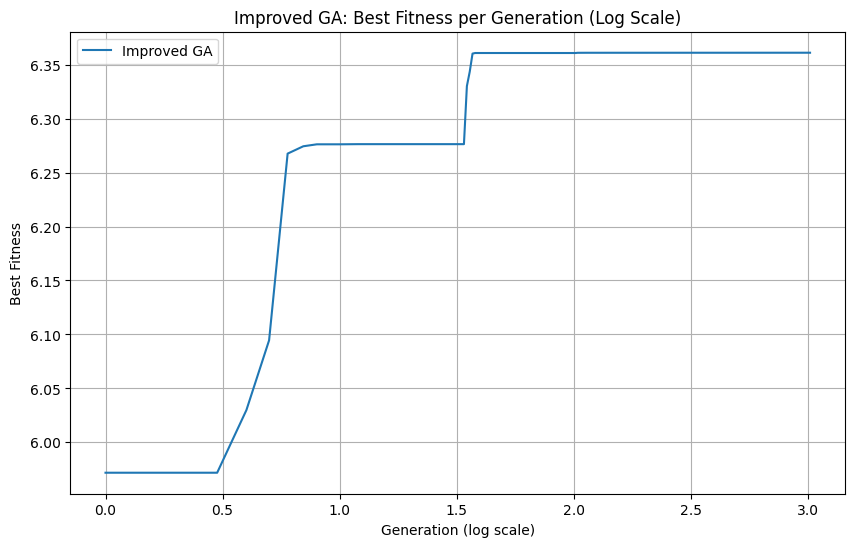

In [17]:
#run the improved GA
best_fitness_imp, best_coords_imp = improved_genetic_algorithm()

#plot best fitness for improved GA
plt.figure(figsize=(10, 6))
plt.plot(np.log10(range(1, len(best_fitness_imp) + 1)), best_fitness_imp, label='Improved GA')
plt.xlabel('Generation (log scale)')
plt.ylabel('Best Fitness')
plt.title('Improved GA: Best Fitness per Generation (Log Scale)')
plt.legend()
plt.grid(True)
plt.show()


Discussion: 
The genetic algorithm may often converge to local optima, resulting in a lower success rate of finding fitness > 6.3. Improvements implimented introducing elitism and adaptive mutations allowed for preservation of good solutions and preventing regression. Increasing mutation rate when fitness stagnation is detected allowed the algorithm to escape local optima more effectively thus improving the success rate. Together the improvements significantly boosted the algorithms ability to find the global maximum with a success rate increase from 44% to 82% (Original GA: Global maximum (>6.3) found in 44/100 runs.
Improved GA: Global maximum (>6.3) found in 82/100 runs.)